# <span style="color:black; font-weight:bold;">Xenium Breast Cancer data Tutorial</span>
#### • <span style="color:black; font-weight:bold;">Creator</span>: Bingjie Dai (17516970902@163.com)
#### • <span style="color:black; font-weight:bold;">Date of Creation</span>: 10.10.2025
#### • <span style="color:black; font-weight:bold;">Date of Last Modification</span>: 10.10.2025
#### • <span style="color:black; font-weight:bold;">Download</span>: Xenium Breast Cancer data used in the tutorial is available at [Xenium_Breast_Cancer.h5ad](https://drive.google.com/open?id=1StPUArtCFN0oyQLoKN6gQ8n9WlWIAkDl&usp=drive_fs)

In [1]:
from SpaLP.utils import prepare_inputs, set_seed,create_new_color_dict,Graph
from SpaLP.RandLA import SpatialAutoencoder
import torch
import torch.nn as nn
import torch.optim as optim
import warnings
import scanpy as sc
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import anndata as ad
from tqdm import tqdm
import time

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
set_seed(7)

## <span style="color:black; font-weight:bold;">Loading Xenium Breast Cancer data</span>
The Xenium Breast Cancer data contains 167,780 cells and 313 genes.

In [4]:
adata=sc.read_h5ad('/home/dbj/SpatialSLM/datasets/GraphST/Xeniumbreastcancer/Xenium_Breast_Cancer.h5ad')
adata.var_names_make_unique()

In [5]:
adata

AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'ensemble_id', 'type'
    obsm: 'spatial'

## <span style="color:black; font-weight:bold;">Data preprocessing</span>
We use [scanpy](https://scanpy.readthedocs.io/en/stable/installation.html) package to perform standard data processing.  
The standard processed expression matrix was saved in adata.obsm[<span style="color:red;">'feat'</span>] and used as input to the model.

In [6]:
sc.pp.normalize_total(adata, target_sum=1e4,inplace=True)
sc.pp.log1p(adata)
sc.pp.scale(adata)
adata.obsm['feat']=adata.X

## <span style="color:black; font-weight:bold;">Compute Spatial Neighbor Graph and build the neighbor index matrix</span>
We compute the spatial Graph using 3 neighbors in Xenium Breast Cancer data. k=3

In [7]:
k=3
graph = prepare_inputs(adata, k, device)

## <span style="color:black; font-weight:bold;">Define Parameters</span>
The hidden layer dimension is 64, the Adam optimizer is used to optimize the model, the learning rate lr is 0.001, and the model is trained for 200 epochs.

In [8]:
in_channels = graph.features.shape[1]
model = SpatialAutoencoder(in_channels, out_channels=64).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [9]:
set_seed(7)
epochs = 200
pbar = tqdm(range(epochs), desc="Training",ncols=200)
for epoch in pbar:
    start_time = time.time()
    model.train()
    optimizer.zero_grad()
    reconstructed,embedding = model(graph.features, graph.neighbor_idx)
    loss = criterion(reconstructed, graph.features)
    loss.backward()
    optimizer.step()
    elapsed = time.time() - start_time
    pbar.set_postfix({"Epoch": epoch,"Loss": f"{loss.item():.4f}"})

Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:07<00:00, 25.24it/s, Epoch=199, Loss=0.8892]


## <span style="color:black; font-weight:bold;">Generate cell embedding and reconstructed gene expression</span>
Cell embedding was saved in adata.obsm[<span style="color:red;">'SpaLP'</span>]. Reconstructed gene expression is constructed as adata2

In [10]:
model.eval()
with torch.no_grad():
    reconstructed,embedding = model(graph.features, graph.neighbor_idx)
    reconstructed = reconstructed.cpu().numpy()
    embedding=embedding.cpu().numpy()

### Cell embedding

In [11]:
adata.obsm['SpaLP']=embedding

### Reconstructed gene expression

In [12]:
adata2=sc.AnnData(reconstructed)
adata2.obs=adata.obs
adata2.var=adata.var
adata2.uns=adata.uns
adata2.obsm=adata.obsm

## <span style="color:black; font-weight:bold;">Identify Niches</span>
We compute Leiden clustering based on the SpaLP embeddings to identify spatial niches.

In [13]:
sc.pp.neighbors(adata, use_rep='SpaLP')
sc.tl.leiden(adata, random_state=2024, resolution=0.4,key_added='SpaLP')

## <span style="color:black; font-weight:bold;">Niche identified by SpaLP</span>

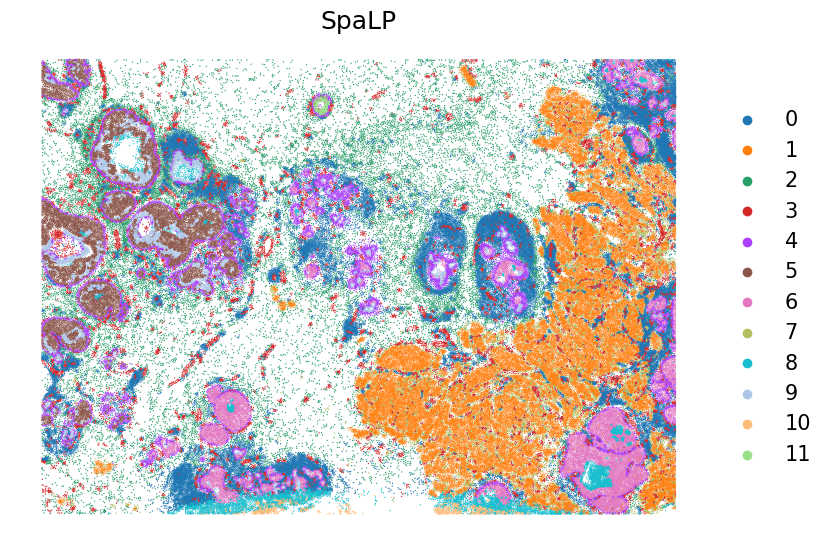

In [20]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9,6.5)
plt.rcParams['font.size'] = 15
sc.pl.embedding(adata,color='SpaLP',basis='spatial',s=3.5,title='SpaLP',frameon=False)

### <span style="color:black; font-weight:bold;">Breast cancer ER+ region</span>

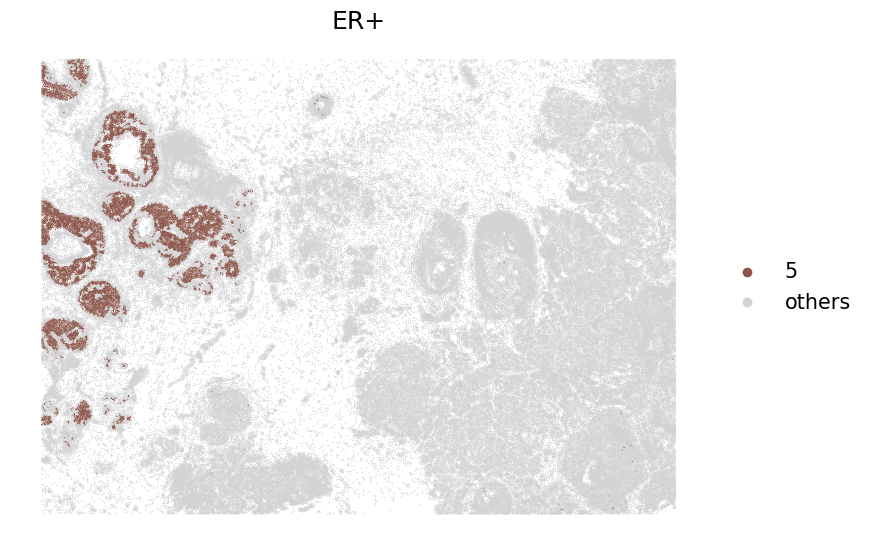

In [34]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9, 6.5)
plt.rcParams['font.size'] = 15
orig_colors = adata.uns['SpaLP_colors']
highlight_color = orig_colors[5] 
custom_colors = ['lightgrey'] * len(orig_colors)
custom_colors[5] = highlight_color
adata.obs['SpaLP_highlight'] = adata.obs['SpaLP'].astype(str)
adata.obs['SpaLP_highlight'] = np.where(adata.obs['SpaLP'] == '5', '5', 'others')

sc.pl.embedding(adata,basis='spatial',color='SpaLP_highlight',palette={'5': highlight_color, 'others': 'lightgrey'},s=3.5,frameon=False,title='ER+')

### <span style="color:black; font-weight:bold;">Breast cancer Triple negative region</span>

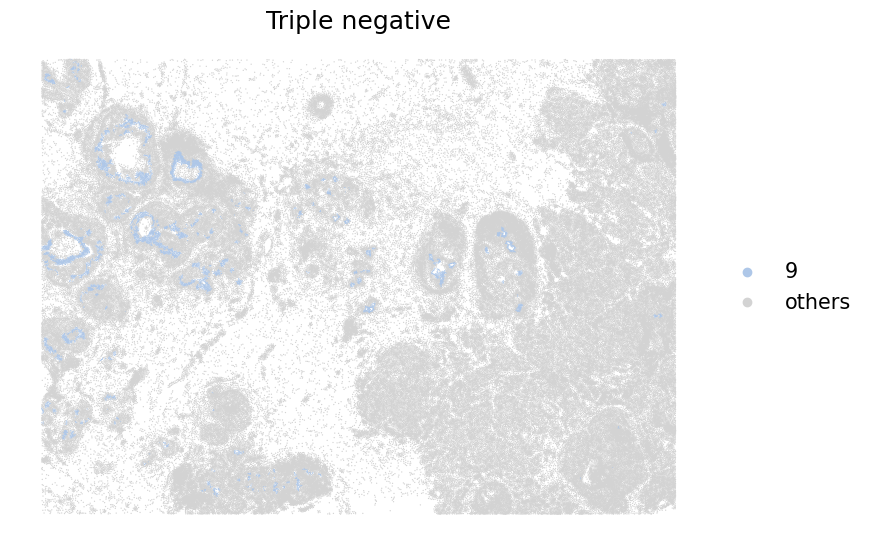

In [37]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9, 6.5)
plt.rcParams['font.size'] = 15
orig_colors = adata.uns['SpaLP_colors']
highlight_color = orig_colors[9] 
custom_colors = ['lightgrey'] * len(orig_colors)
custom_colors[9] = highlight_color
adata.obs['SpaLP_highlight'] = adata.obs['SpaLP'].astype(str)
adata.obs['SpaLP_highlight'] = np.where(adata.obs['SpaLP'] == '9', '9', 'others')

sc.pl.embedding(adata,basis='spatial',color='SpaLP_highlight',palette={'9': highlight_color, 'others': 'lightgrey'},s=3.5,frameon=False,title='Triple negative')

### <span style="color:black; font-weight:bold;">Breast cancer Triple positive region</span>

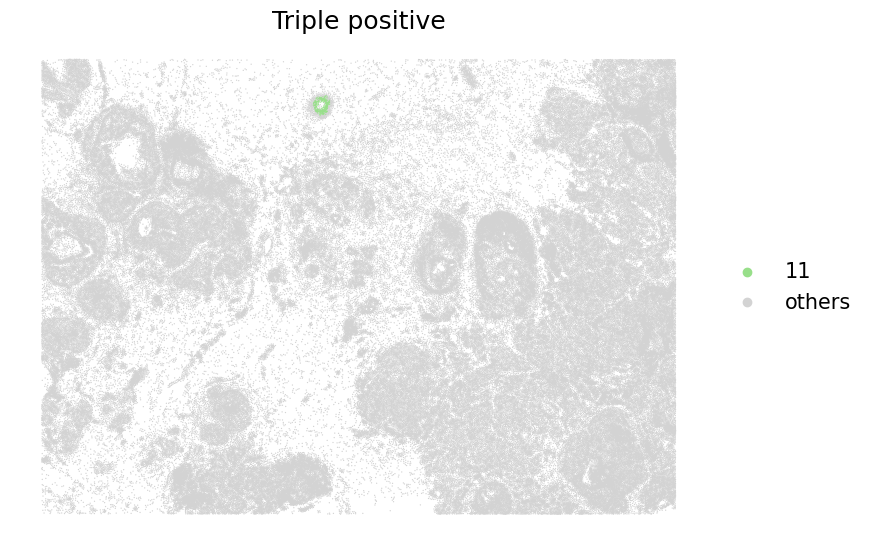

In [36]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9, 6.5)
plt.rcParams['font.size'] = 15
orig_colors = adata.uns['SpaLP_colors']
highlight_color = orig_colors[11] 
custom_colors = ['lightgrey'] * len(orig_colors)
custom_colors[11] = highlight_color
adata.obs['SpaLP_highlight'] = adata.obs['SpaLP'].astype(str)
adata.obs['SpaLP_highlight'] = np.where(adata.obs['SpaLP'] == '11', '11', 'others')

sc.pl.embedding(adata,basis='spatial',color='SpaLP_highlight',palette={'11': highlight_color, 'others': 'lightgrey'},s=3.5,frameon=False,title='Triple positive')

## <span style="color:black; font-weight:bold;">Original gene expression spatial map</span>

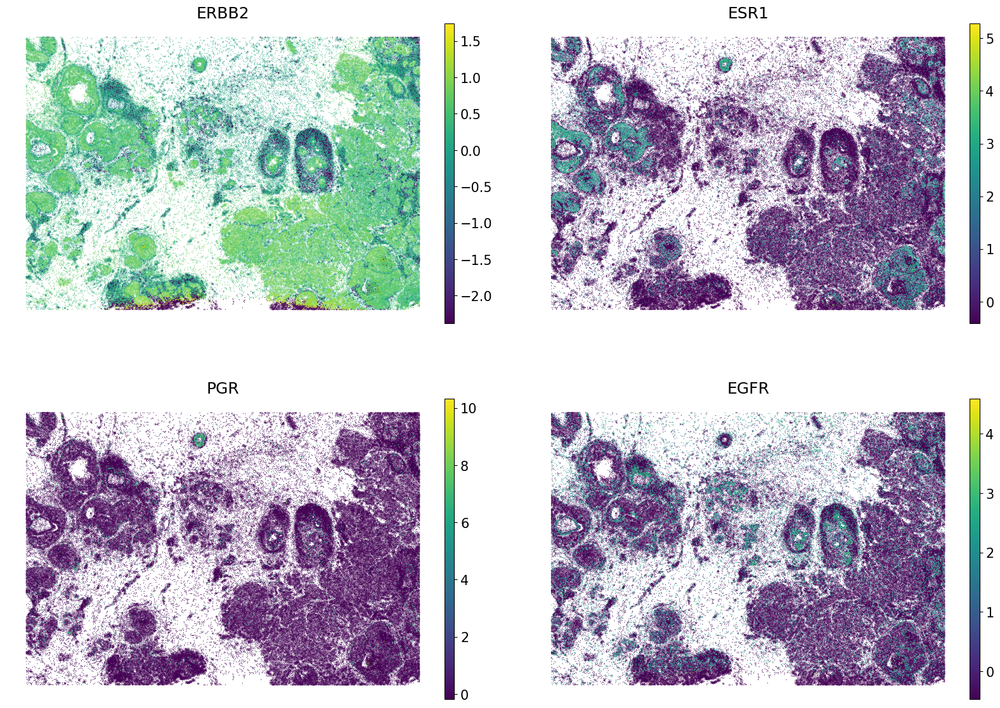

In [32]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9,6.5)
plt.rcParams['font.size'] = 15
sc.pl.embedding(adata,color=['ERBB2','ESR1','PGR','EGFR'],basis='spatial',s=3,frameon=False,ncols=2)

## <span style="color:black; font-weight:bold;">Reconstructed gene expression spatial map</span>

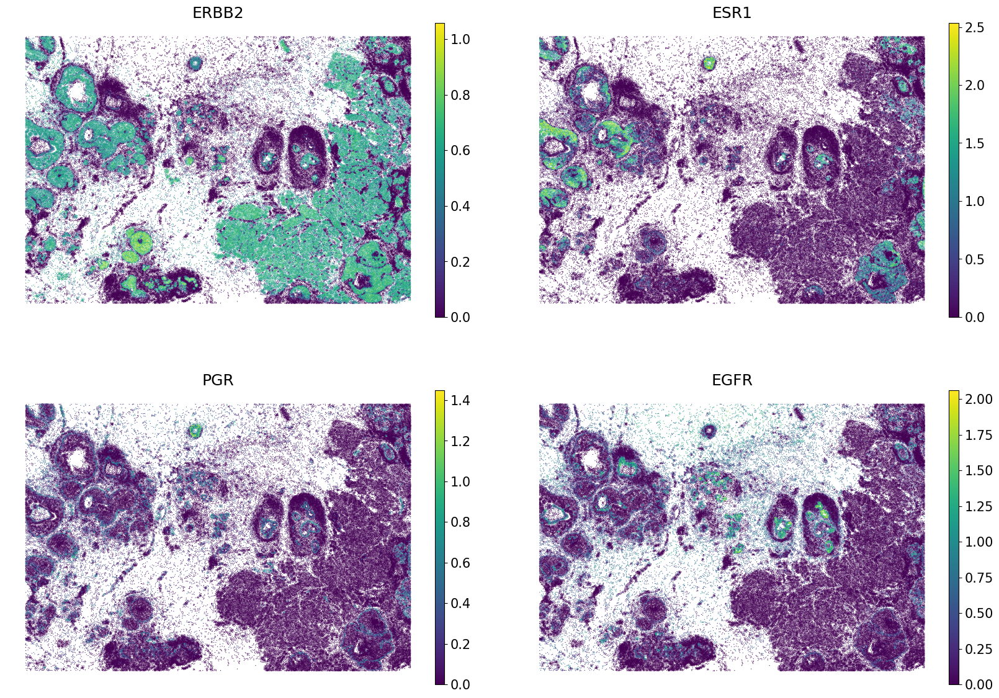

In [31]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (9,6.5)
plt.rcParams['font.size'] = 15
sc.pl.embedding(adata2,color=['ERBB2','ESR1','PGR','EGFR'],basis='spatial',s=3,frameon=False,ncols=2)